### Paper Information

**Title**: [Wasserstein Auto-Encoders](https://arxiv.org/pdf/1711.01558v4.pdf)  
**Authors**: Ilya Tolstikhin, Olivier Bousquet, Sylvain Gelly and Bernhard Scholkopf  
**Code Authors**: Ali Abbasi (_ali.abbasi@metu.edu.tr_), Samet Cetin (_cetin.samet@metu.edu.tr_)

### Paper Abstract

We propose the Wasserstein Auto-Encoder (WAE)—a new algorithm for building a generative model of the data distribution. WAE minimizes a penalized form of the Wasserstein distance between the model distribution and the target distribution, which leads to a different regularizer than the one used by the Variational Auto-Encoder (VAE). This regularizer encourages the encoded training distribution to match the prior. We compare our algorithm with several other techniques and show that it is a generalization of adversarial auto-encoders (AAE). Our experiments show that WAE shares many of the properties of VAEs (stable training, encoder-decoder architecture, nice latent manifold structure) while generating samples of better quality, as measured by the FID score.

### Paper Summary
Wasserstein Auto-Encoder (WAE) is a new family of regularized auto-encoders which minimizes **optimal transport (OT)** $W_C(P_X, G_X)$ between the *true* data distribution $P_X$ and a latent variable model $P_G$. The objective of WAE is composed of a **reconstruction cost** and a **regularizer** $D_Z(P_Z, Q_Z)$ penalizing a discrepancy between two distributions in $Z$.
  
Two different regularizers $D_Z(P_Z, Q_Z)$ are proposed in the paper: **WAE-GAN** is based on GANs and adverserial training _in the latent space Z_ and **WAE-MMD** uses the maximum mean discrepancy. In this work, we only focused on implementing WAE-MMD because it is showed that WEA-MMD is as competitive as WAE-GAN in large scale study and more importantly, it has a much more stable training scheme.

In this work, the authors focus on _latent variable models_ $P_G$ defined by a 2-step procedure:  
- A code $z$ is sampled from a fixed distribution $P_Z$ on a latent space $Z$.
- $z$ is mapped to the image $x \in X = R^d$ with a (possibly random) transformation.  
  
This result in the density of the form,  
$$
P_{G(x)} = \int_Z P_{G(x|z)} p_{z(z)}dz, \forall x \in X
$$
  
Under this model, the OT cost takes a simpler form as the transportation plan factors through the map $G$: instead of finding a coupling $\gamma$ in between two random variables living in the $X$ space, it is sufficient to find a conditional distribution $Q(Z|X)$ such that its $Z$ marginal $Q_Z(Z)$ := $E_{X∼PX}[Q(Z|X)]$ is identical to the prior distribution $P_Z$. This result allows us to optimize over random encoders $Q(Z|X)$ instead of optimizing over all couplings between $X$ and $Y$. In order to implement a numerical solution we relax the constraints on $Q_Z$ by adding a penalty to the objective. This finally leads us to the WAE objective: 
$$
D_{WAE}(P_X,P_G) = \inf_{Q(Z|X) \in Q} E_{P_X} E_{Q(Z|X)}[c(X,G(Z))] + \lambda \cdot D_Z(Q_Z, P_Z)
$$
  
**MMD-based $D_Z$**. For a positive-definite reproducing kernel $k : Z \times Z \rightarrow R$ the following expression is called the maximum mean discrepancy (MMD):  
$$
MMD_k(P_Z, Q_Z) = \Vert \int_Z k(z,.)dP_{Z(z)} - \int_Z k(z,.)dQ_{Z(z)} \Vert_{H_k}
$$
where $H_k$ is the RKHS of real-valued functions mapping $Z$ to $R$.

WEA-MMD method is trained and evaluated on **CelebA** dataset consisting on 203K images. Image **reconstruction**, **interpolation** and **random sampling** are performed for qualitative assessment, whereas, **Fréchet Inception Distance (FID)** is calculated for quantitative assessment.  

### Challenges
Most of the complementary implementation details are mentioned in the appendix, however, some important details are not clear and missing, and there are even some contradictory statements about the hyperparameter setup. Here is the list of challenges that we faced during our work:

- There are contradictory information about the regularization coefficient (lambda). In the paper body, it is mentioned that setting it to 10 seems to work well for all datasets. However, in the appendix, setting it to 100 is proposed for CelebA dataset. It is confusing. We set it to 10.

- Last activation function of the decoder network is not mentioned at all. We think it should be tanh.
    
- Preprocessing details are not mentioned in full details. Center cropping and resizing are mentioned but we believe there should also be a normalization step ((X-0.5)/0.5). 
    
- FID is calculated by using 10K samples in the paper. However, we couldn't be able to perform qunatitative assessment with 10K samples because of the memory problems. We had to use 1K samples.

### Modules

In [23]:
from generate import reconstruction, interpolation, random_sampling
from model import Encoder, Decoder
from compute_fid import *
from kernel import IMQ
from tool import *

from torchvision.transforms import transforms
from torchvision.datasets import CelebA
from torchvision.utils import make_grid

from torch.optim.lr_scheduler import MultiStepLR
from torch.utils.data import DataLoader
from torch.optim import Adam

import torch.nn.functional as F
import torch.nn as nn

import matplotlib.pyplot as plt
import numpy as np
import os

from IPython.display import Image

join = os.path.join

### Device Selection CPU/GPU

In [2]:
# set device
device = set_device()
device

device(type='cuda')

### Hyperparameters

In [3]:
DSET = 'CelebA' # dataset
N_CHANNEL = 3 # num of channels of input images
METHOD = 'wae-mmd' # WAE method
N_EPOCH = 55 # num of training epochs
BATCH_SIZE = 100 # batch size
INIT_LR = 1e-3 #5e-4 # initial learning rate
BETA1 = .5 # beta param for Adam optimizer
BETA2 = .999 # beta param for Adam optimizer
MILE1 = 30 # 1st milestone (completed training epochs) of lr update
MILE2 = 50 # 2nd milestone (completed training epochs) of lr update
GAMMA = .5 # Multiplicative factor of learning rate decay
H_DIM = 128 # first and last dimension of encoder and decoder, respectively
Z_DIM = 64 # noise vector dimension
KERNEL_SIZE = 5 # size of filter mask in convolutional layers
LAMBDA = 10. # regularization coefficient
SIGMA = 2. # kernel base scale
VERBOSE = True # display information during training
VERBOSE_PERIOD = 5 # period of displaying information during training
SAVE = True # save models during training
SAVE_PERIOD =  5 # period of saving models during training
CHECK_PATH  = "./checkpoint/wae-mmd/" # checkpoint path -- directory to save trained models
PARALLEL = (device == torch.device('cuda')) # if working on GPU device, allows working on multiple GPUs

### Reproducibility

In [4]:
# set seed for all random number generators for reproducibility
seed = 123
set_seed(seed)

### Data Loading

In [5]:
# Preprocessing steps are followed as stated in the paper: 
# (1) 140x140 center crops are taken from raw images
# (2) crops are resized to 64x64 resolution
# (3) x/255. - ToTensor() performs this by default to RGB images
# (4) normalization is applied [ (x - 0.5) / 0.5 ]

# load CelebA train data
train_data = CelebA(root='data/', split='train', download=True, 
                    transform=transforms.Compose([transforms.CenterCrop(size=(140, 140)),
                    transforms.Resize(size=(64, 64), interpolation=0), # interpolation: nearest 
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(.5, .5, .5), std=(.5, .5, .5))]))
# load CelebA test data
test_data = CelebA(root='data/', split='test', download=True,
                    transform=transforms.Compose([transforms.CenterCrop(size=(140, 140)),
                    transforms.Resize(size=(64, 64), interpolation=0), # interpolation: nearest 
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(.5, .5, .5), std=(.5, .5, .5))]))

# set train data loader
train_loader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)

# set test data loder - load one-by-one, no need to shuffle
test_loader = DataLoader(dataset=test_data, batch_size=1, shuffle=False)

# get data information
n_train_sample, n_train_batch = len(train_data), len(train_loader)
n_test_sample, n_test_batch = len(test_data), len(test_loader)

print("- #of train samples = {} \t #of train batches = {}".format(n_train_sample, n_train_batch))
print("- #of test samples  = {} \t #of test batches = {}".format(n_test_sample, n_test_batch))

Files already downloaded and verified
Files already downloaded and verified
- #of train samples = 162770 	 #of train batches = 1628
- #of test samples  = 19962 	 #of test batches = 19962


### Initialize Encoder Network

In [7]:
# initialize encoder
encoder = Encoder(H_DIM, Z_DIM, N_CHANNEL, KERNEL_SIZE).to(device)
if PARALLEL: 
    encoder = nn.DataParallel(encoder) # set parallel processing mode for multiple GPUs
encoder.train() # encoder train mode: ON

DataParallel(
  (module): Encoder(
    (conv1): Conv2d(3, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv4): Conv2d(512, 1024, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn4): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (out): Linear(in_features=16384, out_features=64, bias=True)
  )
)

### Initialize Decoder Network

In [8]:
# initialize decoder
decoder = Decoder(H_DIM, Z_DIM, N_CHANNEL, KERNEL_SIZE).to(device)
if PARALLEL: 
    decoder = nn.DataParallel(decoder) # set parallel processing mdoe for multiple GPUs
decoder.train() # decoder train mode: ON

DataParallel(
  (module): Decoder(
    (inp): Linear(in_features=64, out_features=65536, bias=True)
    (conv1): ConvTranspose2d(1024, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv4): ConvTranspose2d(128, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  )
)

### Initialize Optimizers & Schedulers

In [9]:
# initialize encoder optimizer and scheduler
optim_encoder = Adam(encoder.parameters(), betas=(BETA1, BETA2), lr=INIT_LR)
scheduler_encoder = MultiStepLR(optim_encoder, milestones=[MILE1, MILE2], gamma=GAMMA)

# initialize decoder optimizer and scheduler
optim_decoder = Adam(decoder.parameters(), betas=(BETA1, BETA2), lr=INIT_LR)
scheduler_decoder = MultiStepLR(optim_decoder, milestones=[MILE1, MILE2], gamma=GAMMA)

### Training

Epoch-1	Reconstruction Loss = 0.13040766540617016
Epoch-2	Reconstruction Loss = 0.06870347812177655
Epoch-3	Reconstruction Loss = 0.058055093978029465
Epoch-4	Reconstruction Loss = 0.05392062002007364
Epoch-5	Reconstruction Loss = 0.04974544408090388


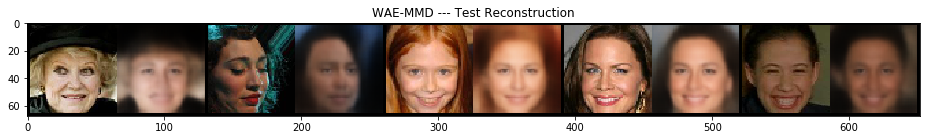

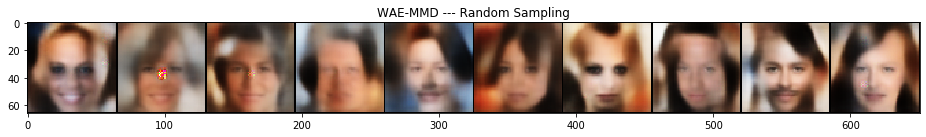

Epoch-6	Reconstruction Loss = 0.047583961394170496
Epoch-7	Reconstruction Loss = 0.045979188314239715
Epoch-8	Reconstruction Loss = 0.04438939572814247
Epoch-9	Reconstruction Loss = 0.043605267859658015
Epoch-10	Reconstruction Loss = 0.04233438117442087


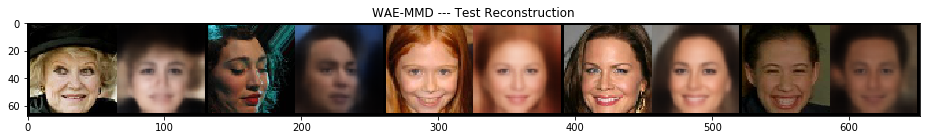

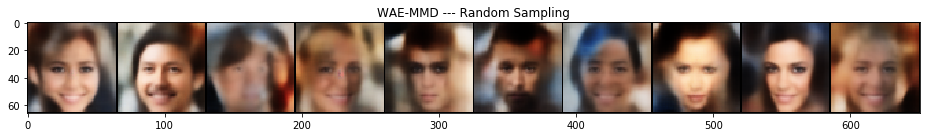

Epoch-11	Reconstruction Loss = 0.04153810695537868
Epoch-12	Reconstruction Loss = 0.04083595156748347
Epoch-13	Reconstruction Loss = 0.040212670043490766
Epoch-14	Reconstruction Loss = 0.03965850754013268
Epoch-15	Reconstruction Loss = 0.039150210800859044


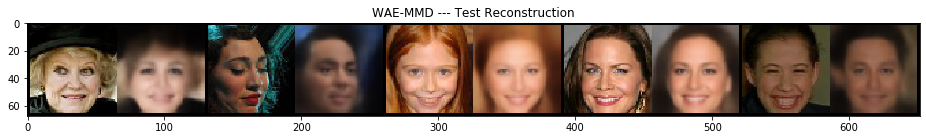

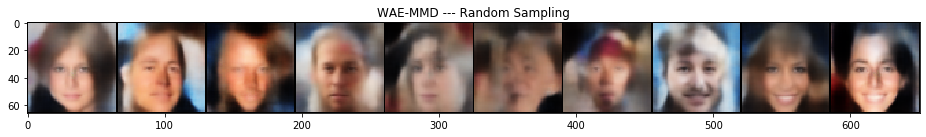

Epoch-16	Reconstruction Loss = 0.03869907066629729
Epoch-17	Reconstruction Loss = 0.03825261195622755
Epoch-18	Reconstruction Loss = 0.037899935270048604
Epoch-19	Reconstruction Loss = 0.03753722871178204
Epoch-20	Reconstruction Loss = 0.03722702879855753


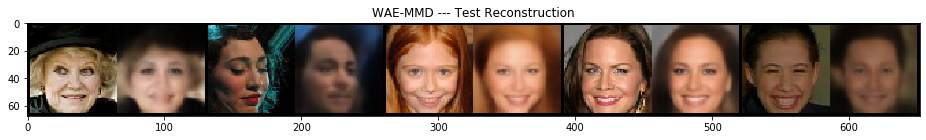

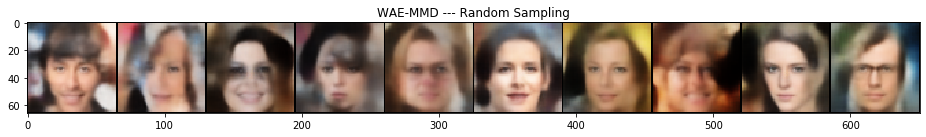

Epoch-21	Reconstruction Loss = 0.036904880618052305
Epoch-22	Reconstruction Loss = 0.036538330405637455
Epoch-23	Reconstruction Loss = 0.03630335131060354
Epoch-24	Reconstruction Loss = 0.03605599953480183
Epoch-25	Reconstruction Loss = 0.03582203683614504


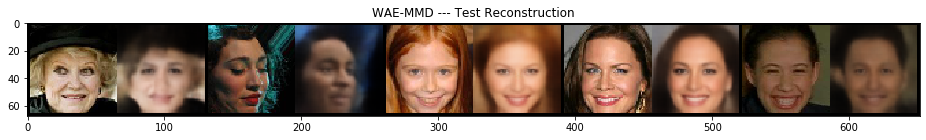

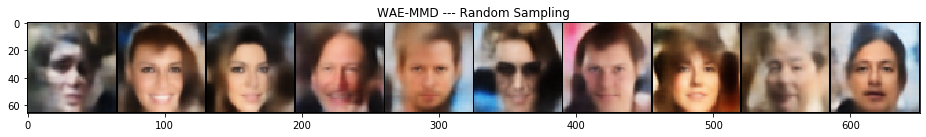

Epoch-26	Reconstruction Loss = 0.03556837315133363
Epoch-27	Reconstruction Loss = 0.03532541828689934
Epoch-28	Reconstruction Loss = 0.035113735789216956
Epoch-29	Reconstruction Loss = 0.03492573892161339
Epoch-30	Reconstruction Loss = 0.034709144512979524


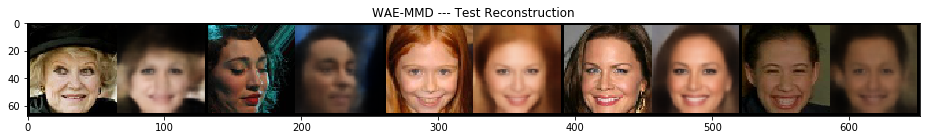

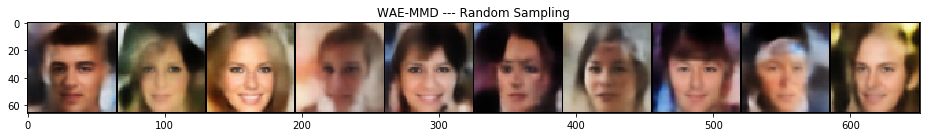

Epoch-31	Reconstruction Loss = 0.033342746917382426
Epoch-32	Reconstruction Loss = 0.032972988141064946
Epoch-33	Reconstruction Loss = 0.0327597205606258
Epoch-34	Reconstruction Loss = 0.03255296111406232
Epoch-35	Reconstruction Loss = 0.03238678750831906


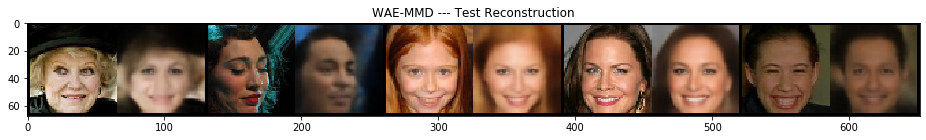

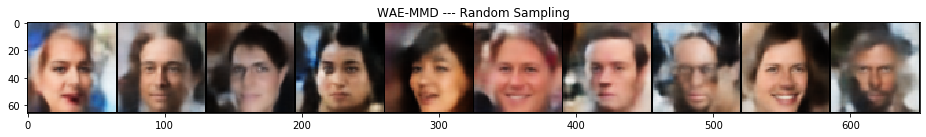

Epoch-36	Reconstruction Loss = 0.03223505009252045
Epoch-37	Reconstruction Loss = 0.032093961701806846
Epoch-38	Reconstruction Loss = 0.031989076572282754
Epoch-39	Reconstruction Loss = 0.031856113680083765
Epoch-40	Reconstruction Loss = 0.03175505342262598


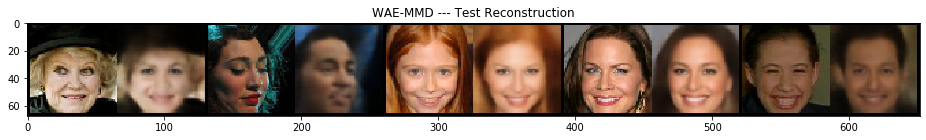

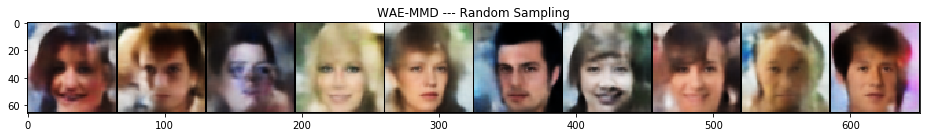

Epoch-41	Reconstruction Loss = 0.03163319476323697
Epoch-42	Reconstruction Loss = 0.03154807580272081
Epoch-43	Reconstruction Loss = 0.031414858587422635
Epoch-44	Reconstruction Loss = 0.031343070827820466
Epoch-45	Reconstruction Loss = 0.031239135561496847


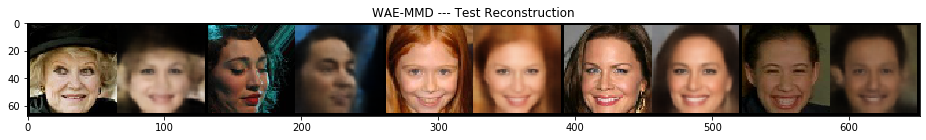

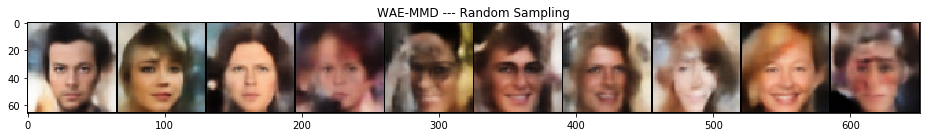

Epoch-46	Reconstruction Loss = 0.031147196002287617
Epoch-47	Reconstruction Loss = 0.031075650579948613
Epoch-48	Reconstruction Loss = 0.030989394792524216
Epoch-49	Reconstruction Loss = 0.03092143682909113
Epoch-50	Reconstruction Loss = 0.030841192899678887


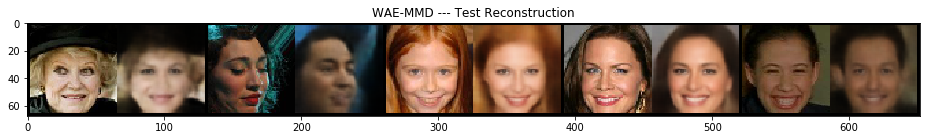

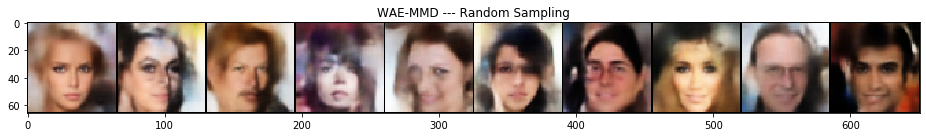

Epoch-51	Reconstruction Loss = 0.030178973139881347
Epoch-52	Reconstruction Loss = 0.03000207936646766
Epoch-53	Reconstruction Loss = 0.029907197994006943
Epoch-54	Reconstruction Loss = 0.02983778698655145
Epoch-55	Reconstruction Loss = 0.029783569146564496


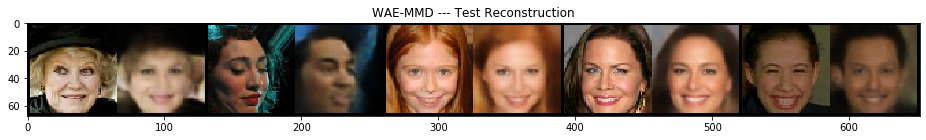

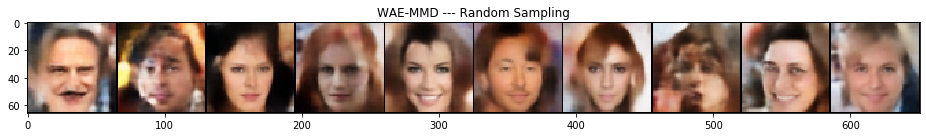

In [10]:
# ------------------------------- #
# ITERATION OVER EPOCHS
# ------------------------------- #
for epoch_idx in range(1, N_EPOCH + 1):

    # initialize epoch reconstruction loss
    epoch_recon_loss = 0.

    # ------------------------------- #
    # ITERATION OVER BATCHES
    # ------------------------------- #
    for batch_idx, (x, _) in enumerate(train_loader):

        encoder.train() # encoder train mode: ON
        decoder.train() # decoder train mode: ON

        # batch images
        x = x.to(device)

        # -------------------------------------------------------------- #
        # WAE-MMD METHOD
        # -------------------------------------------------------------- #
        # ------------------------------- #
        # RECONSTRUCTION
        # Reconstruct batch images
        # ------------------------------- #
        # encode images
        z = encoder(x)
        # decode images
        x_recon = decoder(z)
        # calculate reconstruction loss
        recon_loss = F.mse_loss(x_recon, x)

        # ------------------------------- #
        # IMQ KERNEL
        # ------------------------------- #
        # generate random noise from prior P(z)
        z_fake = torch.randn(x.shape[0], Z_DIM).to(device)
        # encode images
        z = encoder(x)
        # calculate kernel loss
        kernel_loss = IMQ(z, z_fake, Z_DIM, SIGMA, device)
                   
        # calculate total loss
        loss = recon_loss + (LAMBDA * kernel_loss)

        # set gradients to zero
        optim_encoder.zero_grad()
        optim_decoder.zero_grad()

        # calculate gradients
        loss.backward()

        # update weights
        optim_encoder.step()
        optim_decoder.step()

        epoch_recon_loss += recon_loss.item() * BATCH_SIZE

    # update optimizers' learning rates
    scheduler_encoder.step()
    scheduler_decoder.step()

    if VERBOSE:
        
        print("Epoch-{}\tReconstruction Loss = {}".format(epoch_idx, epoch_recon_loss/n_train_sample))
        
        if epoch_idx % VERBOSE_PERIOD == 0:

            encoder.eval() # encoder evaluation mode: ON
            decoder.eval() # decoder evaluation mode: ON

            # -----------------------
            # Reconstruction
            # -----------------------
            n_sample = 5 # number of generated samples
            grid_images = [] # empty list to store generated images 

            # set data iteration
            data_iter = iter(test_loader)

            for _ in range(n_sample):
                # get next sample image
                x, _ = next(data_iter)
                # reconstruct image
                x, x_recon = reconstruction(x, encoder, decoder, device)
                # make sample grid image
                grid_image = make_grid(torch.cat((x, x_recon)), padding=0).unsqueeze(0)
                # store grid image
                grid_images.append(grid_image)

            # make grid image using all generated images
            grid_images = make_grid(torch.cat(grid_images), padding=2, nrow=n_sample)
            # plot generated images
            plt.figure(figsize=(16, 4))
            plt.imshow(grid_images.permute(1, 2, 0))
            plt.title("WAE-MMD --- Test Reconstruction", fontsize=12)
            plt.show()

            # -----------------------
            # Random Sampling
            # -----------------------
            # generate random samples
            n_sample = 10
            x_sampled = random_sampling(decoder, n_sample, Z_DIM, device)
            # make grid image
            grid_img = make_grid(x_sampled, padding=1, nrow=n_sample)
            # display generated images
            plt.figure(figsize=(16, 4))
            plt.imshow(grid_img.permute(1, 2, 0))
            plt.title("WAE-MMD --- Random Sampling", fontsize=12)
            plt.show()
        
    if SAVE and epoch_idx % SAVE_PERIOD == 0:
        # check path, create if not exist
        os.makedirs(CHECK_PATH, exist_ok=True)
        # save encoder
        encoder_path = join(CHECK_PATH, "encoder_{}.pt".format(epoch_idx))
        torch.save(encoder.state_dict(), encoder_path)
        # save decoder 
        decoder_path = join(CHECK_PATH, "decoder_{}.pt".format(epoch_idx))
        torch.save(decoder.state_dict(), decoder_path)

### Load Pretrained Encoder Network

In [6]:
# initialize encoder
encoder = Encoder(H_DIM, Z_DIM, N_CHANNEL, KERNEL_SIZE).to(device)
# if current device is cuda, apply data parallelization among GPUs
if PARALLEL:
    encoder = nn.DataParallel(encoder)
    
# load encoder weights
encoder_path = join(CHECK_PATH, "encoder_{}.pt".format(N_EPOCH)) # path to last saved encoder's weights
if PARALLEL:
    encoder_state_dict = torch.load(encoder_path, map_location=device)
else:
    encoder_state_dict = from_parallel(encoder_path, device)
encoder.load_state_dict(encoder_state_dict)
encoder.eval() # encoder evaluation mode: ON

DataParallel(
  (module): Encoder(
    (conv1): Conv2d(3, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv4): Conv2d(512, 1024, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (bn4): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (out): Linear(in_features=16384, out_features=64, bias=True)
  )
)

### Load Pretrained Decoder Network

In [7]:
# initialize decoder
decoder = Decoder(H_DIM, Z_DIM, N_CHANNEL, KERNEL_SIZE).to(device)
# if current device is cuda, apply data parallelization among GPUs
if PARALLEL:
    decoder = nn.DataParallel(decoder)

# load decoder weights
decoder_path = join(CHECK_PATH, "decoder_{}.pt".format(N_EPOCH)) # path to last saved encoder's weights
if PARALLEL:
    decoder_state_dict = torch.load(decoder_path, map_location=device)
else:
    decoder_state_dict = from_parallel(decoder_path)
decoder.load_state_dict(decoder_state_dict)
decoder.eval() # decoder evaluation mode: ON

DataParallel(
  (module): Decoder(
    (inp): Linear(in_features=64, out_features=65536, bias=True)
    (conv1): ConvTranspose2d(1024, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv4): ConvTranspose2d(128, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  )
)

### Reconstruction
A couple of test images are sampled and their auto-encoded versions are generated. These reconstructed images refer to middle column (WAE-MMD) - middle row (Test reconstructions) of Figure 3 in the paper.

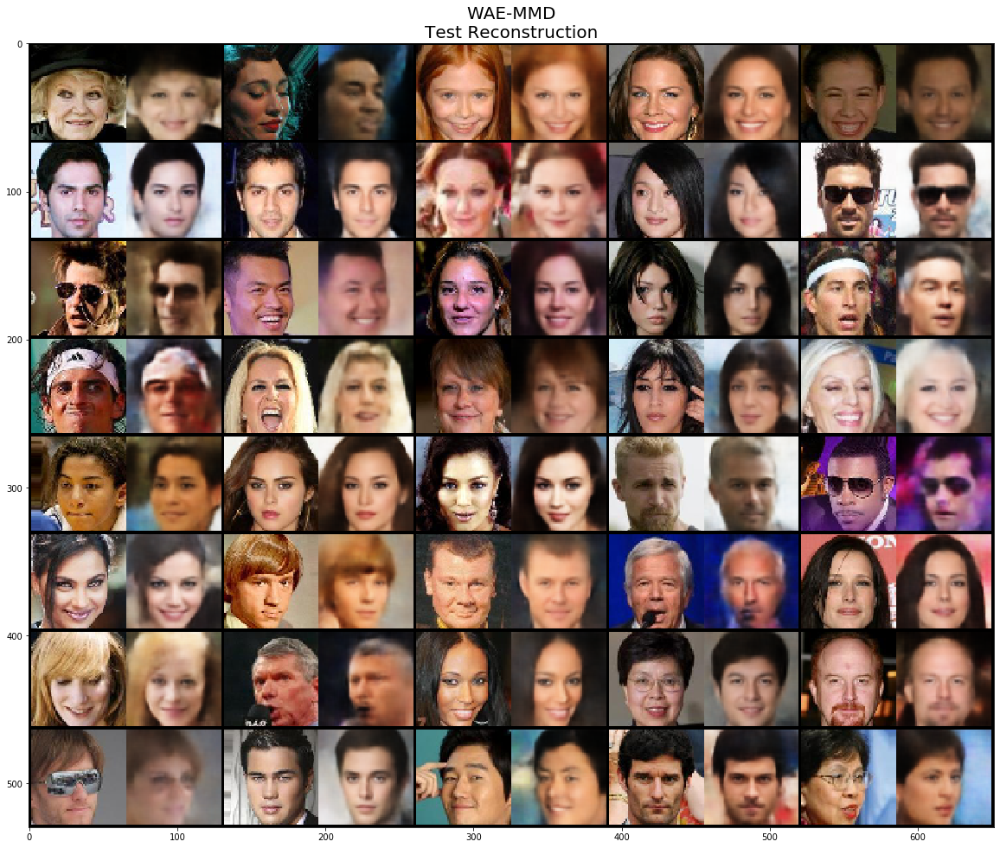

In [8]:
# set output figure size
plt.figure(figsize=(20, 20))

n_sample = 40 # number of generated samples
grid_images = [] # empty list to store generated images 

# set data iteration
data_iter = iter(test_loader)

for _ in range(n_sample):
    # get next sample image
    x, _ = next(data_iter)
    # reconstruct image
    x, x_recon = reconstruction(x, encoder, decoder, device)
    # make sample grid image
    grid_image = make_grid(torch.cat((x, x_recon)), padding=0).unsqueeze(0)
    # store grid image
    grid_images.append(grid_image)

# make grid image using all generated images
grid_images = make_grid(torch.cat(grid_images), padding=2, nrow=5)
# plot generated images
plt.imshow(grid_images.permute(1, 2, 0))
plt.title("WAE-MMD\nTest Reconstruction", fontsize=20)
plt.show()

### Reconstruction results from paper
Figure 3 in paper, WAE-MMD reconstruction results.  

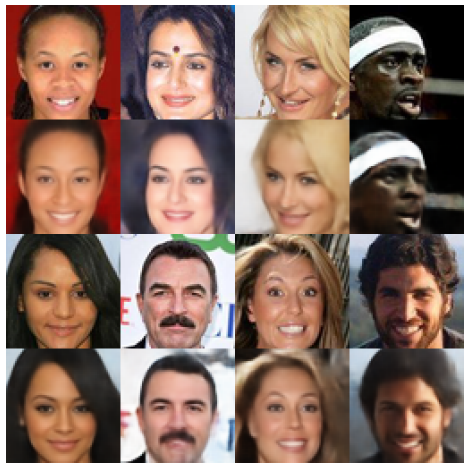

In [27]:
Image(filename="image/paper_results/reconstruction.png")

### Interpolation
A pair of test images $(x, y)$ are sampled and encoded $(z_x, z_y)$ to latent space Z. Then, latent codes $(z_x, z_y)$ are linearly interpolated in the latent space by taking equally-sized steps and these latent codes are decoded (mapped back to) to image space $X$. These generated images refer to middle column (WAE-MMD) - first row (Test interpolations) of Figure 3 in the paper.

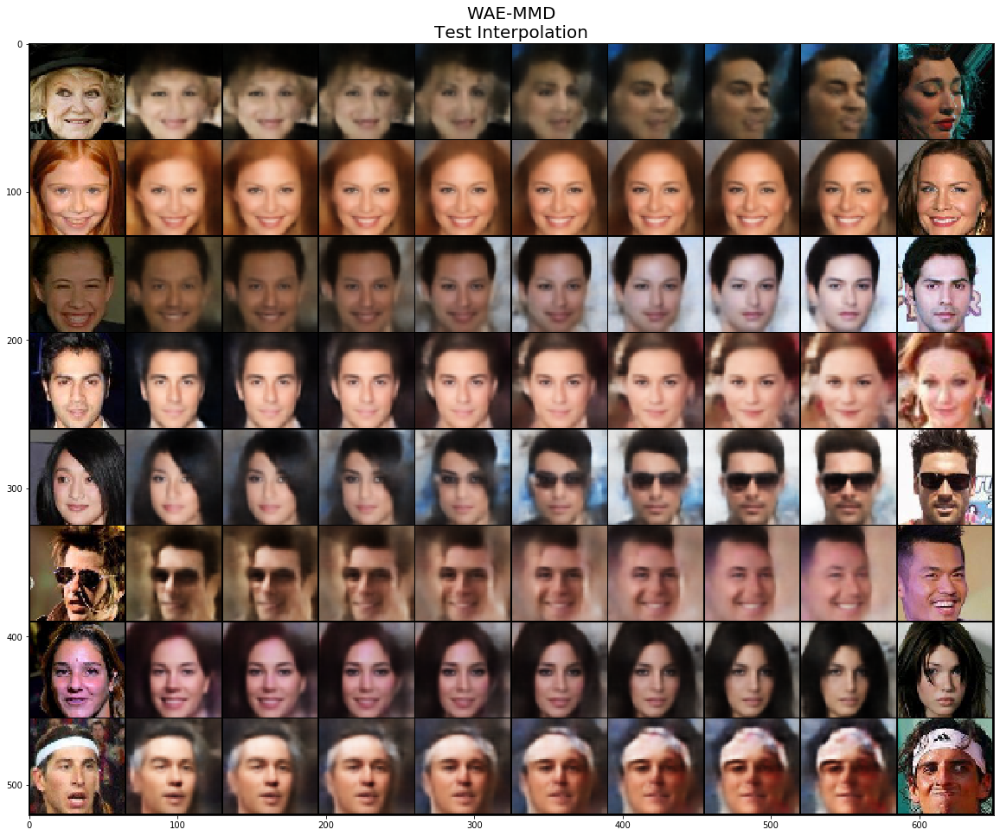

In [9]:
# set output figure size
plt.figure(figsize=(20, 20))

n_sample = 8 # num of generated samples
n_step = 8 # num of intepolation steps

grid_images = [] # empty list to store generated images

# set data iteration
data_iter = iter(test_loader)

for i in range(n_sample):
    # get next sample image
    x1, _ = next(data_iter)
    # get next sample image
    x2, _ = next(data_iter)
    # reconstruct image
    x_inter_codes = interpolation(x1, x2, encoder, decoder, n_step, device)
    # store image
    grid_images.append(x_inter_codes)
    
# make grid image using all generated images
grid_images = make_grid(torch.cat(grid_images), padding=1, nrow=10)
# plot generated images
plt.imshow(grid_images.permute(1, 2, 0))
plt.title("WAE-MMD\nTest Interpolation", fontsize=20)
plt.show()

### Interpolation results from paper
Figure 3 in paper, WAE-MMD interpolation results.  

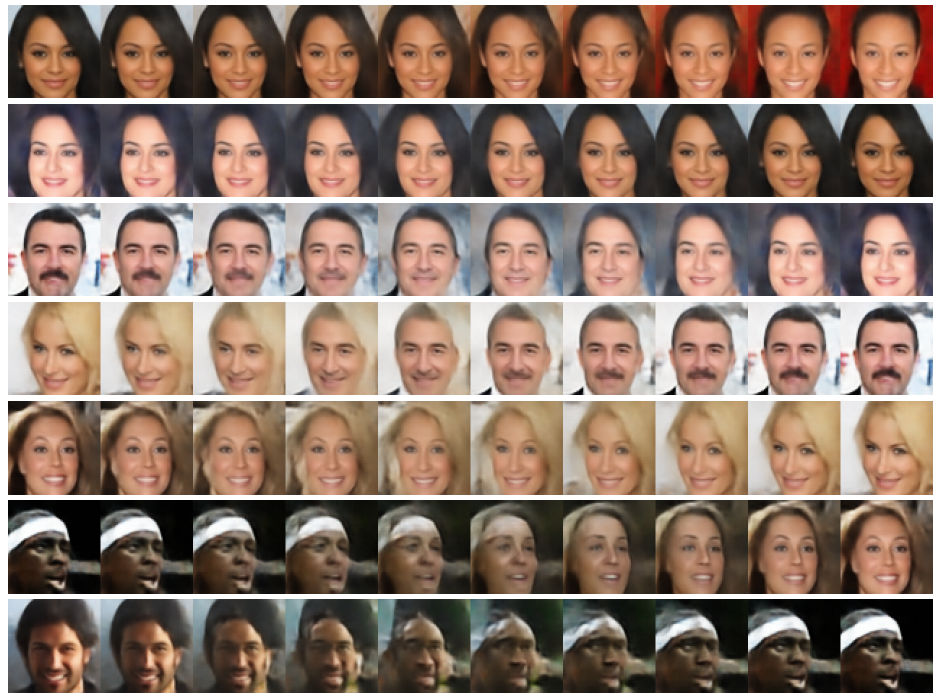

In [26]:
Image(filename="image/paper_results/interpolation.png")

### Random Sampling
Random samples are generated by sampling a noise vector (z) from prior distribution $P_z$ and decoding $z$ to image space $X$. Generated images refer to middle column (WAE-MMD) - last row (Random samples) of Figure 3 in the paper.

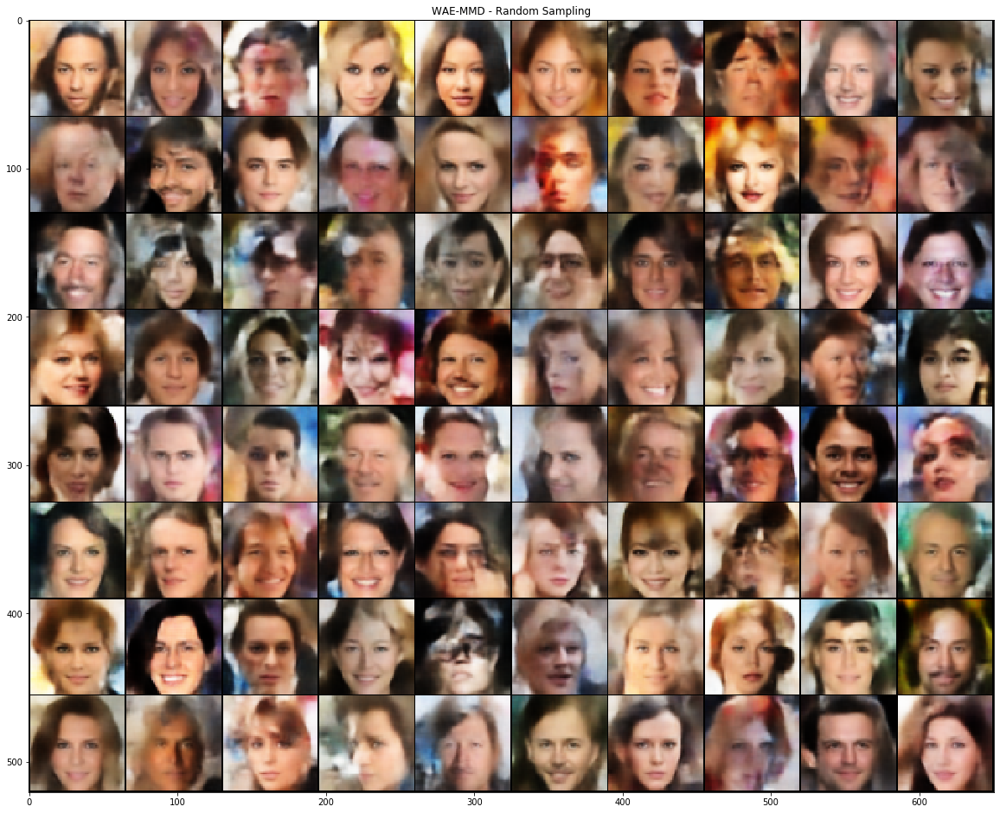

In [10]:
# check path
gen_path = join("image", "random_sampled")
os.makedirs(gen_path, exist_ok=True)
    
n_sample = 1000 # num of generated samples
n_img_to_display = 80 # number of images to display among all generated images

# generate random samples 
x_sampled = random_sampling(decoder, n_sample, Z_DIM, device)

# make grid image
grid_img = make_grid(x_sampled[:n_img_to_display], padding=1, nrow=10)
# display generated images
plt.figure(figsize=(20, 20))
plt.imshow(grid_img.permute(1, 2, 0))
plt.title("WAE-MMD - Random Sampling", fontsize=12)
plt.show()

### Random sampling results from paper
Figure 3 in paper, WAE-MMD random sampling results. 

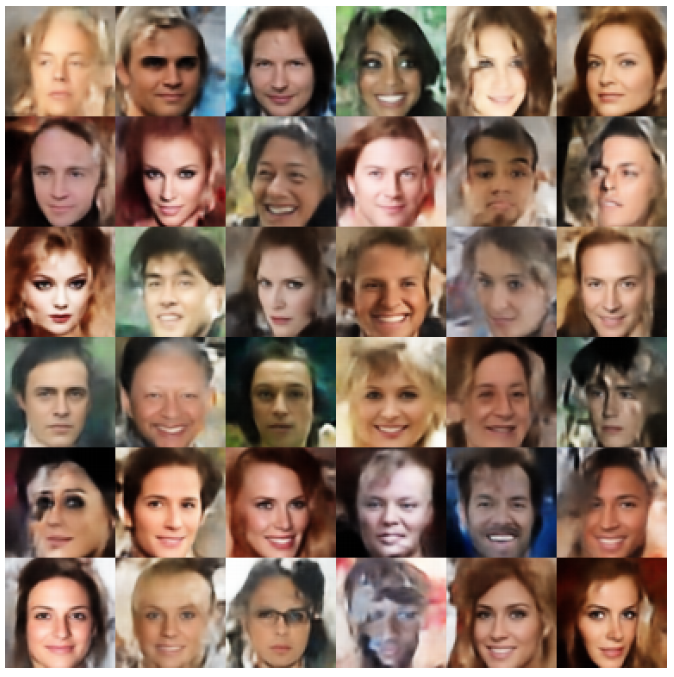

In [25]:
Image(filename="image/paper_results/random_sampling.png")

### FID (Fréchet Inception Distance) Calculation
Fréchet Inception Distance (FID) is calculated to quantitatively assess the quality of the generated images by random sampling. Result is reported on CelebA dataset based on 1000 samples. Obtained result refers to 2nd row of Table 1 in the paper. __Proposed Fréchet Inception Distance of WAE-MMD in the paper is 55__. We do not calculate sharpness.

In [11]:
# randomly choose test samples
test_loader_shuffled = DataLoader(dataset=test_data, batch_size=n_sample, shuffle=True)
for x, _ in test_loader_shuffled:
    # get first batch and stop!
    x_true = x
    break
    
# transfer chosen (true) and generated test samples to numpy array
x_true_list = x_true.numpy()
x_sampled_list = x_sampled.numpy()

# calculate FID between true and generated samples, this may take a while to compute...
fid = calculate_fid_given_samples(x_true_list, x_sampled_list, cuda=(device==torch.device('cuda')))
print('Fréchet Inception Distance (FID) = ', fid)

Fréchet Inception Distance (FID) =  99.75676458019791
